# 04 高さ P 制御（S2-B）

## 背景

03 では関節目標を補間して $z$ を変えた。脚力の和は $mg$ のままだった。この段の新しい現象は、**力側**に高さの比例・微分を足すことである（[S2-B](../docs/block-curriculum/02_Stage_Ladder.md)）。関節 PD は足さない。予測最適化はまだ無い。

下位は 02 の $\tau=h-J^{\top}F$。変わるのは $F_z$ の合計だけである。

### 成功条件（数値。ここが合否）

[README §3.8](../docs/block-curriculum/00_README.md)。**連続 5.0 秒以上、全ステップ。** 一瞬の通過は失敗。2 つの $z^{ref}$ の**それぞれ**で 5.0 s。

$z_0$ は走行開始時のベース高さ。$z_{\mathrm{lo}}=z_0-0.03\,\mathrm{m}$。

| 区間 | 量 | 条件 |
|---|---|---|
| 公称 $z^{ref}=z_0$ | $\lvert z-z_0\rvert$ | $<0.015\,\mathrm{m}$、連続 $\ge 5.0\,\mathrm{s}$ |
| 低い $z^{ref}=z_{\mathrm{lo}}$ | $\lvert z-z_{\mathrm{lo}}\rvert$ | $<0.015\,\mathrm{m}$、連続 $\ge 5.0\,\mathrm{s}$ |
| 両区間 | $\lvert\mathrm{roll}\rvert,\lvert\mathrm{pitch}\rvert$ | $<0.10\,\mathrm{rad}$ |
| 両区間 | $\lVert v\rVert$ | $<0.15\,\mathrm{m/s}$ |
| 両区間 | `qpos` | 有限 |
| 結果 | GIF | 1 本以上。指令 GRF と実接触 |

関節補間（03 の $q^{des}$）は使わない。満たすまで 05 へ進まない。

## 目的

- $F_z$ 合計を $mg+k_p(z^{ref}-z)-k_d\dot z$ にし、4 脚で割る
- 公称と $-3\,\mathrm{cm}$ を、関節 PD 無しでそれぞれ 5 秒以上保持する
- ゲインが弱い／強すぎると 5 秒に届かないことを、失敗ログで残す

## 数式

$$
\sum_i F_{z,i} = mg + k_p(z^{ref}-z) - k_d \dot z, \qquad F_{x,i}=F_{y,i}=0
$$

$$
\tau = h - J^{\top} F
$$

試行で使うゲイン: 失敗 $k_p=0$、失敗 $k_p=800$、$k_d=80$、成功 $k_p=8000\,\mathrm{N/m}$、$k_d=400\,\mathrm{N\cdot s/m}$。

## 図

```
z_ref(t):  z0 --hold 5.5s--> z0-3cm --hold 8s
              |
         HeightPdShare --> F --> h - J^T F --> clip --> z(t)
```

## 思考過程

03 のしゃがみは関節を折った。ここでは足の折れ目標を出さず、鉛直力だけ増減する。弱すぎると $z$ が動かず、強すぎると潰れる。

## 仮説

1. $k_p=0$ なら $z^{ref}$ を下げても $z$ は公称のまま（03 試行 1 と同じ観察）
2. 中程度の $k_p$ では一度近づいてから潰れる／5 秒持たない
3. $k_p=8000$、$k_d=400$ なら背景の 5 秒を両方満たす


In [1]:
from pathlib import Path
import sys
import numpy as np
import mujoco
from IPython.display import Image, display

here = Path.cwd().resolve()
for p in [here, *here.parents]:
    if (p / "src" / "mpc_dog").is_dir():
        sys.path.insert(0, str(p / "src"))
        break

from mpc_dog.plant.mujoco_go2 import MujocoGo2
from mpc_dog.viz.gif import render_rollout_gif

# 背景の成功条件。変えたら上の表も更新する。
HOLD_S = 5.0
Z_TOL = 0.015
ATT_TOL = 0.10
V_TOL = 0.15
DZ_CMD = 0.03
T_HI, T_LO = 5.5, 8.0
KP_OK, KD_OK = 8000.0, 400.0

def longest_true_seconds(flags, dt):
    best = cur = 0
    for f in flags:
        cur = cur + 1 if f else 0
        if cur > best:
            best = cur
    return best * float(dt)

def clip_torque(tau, ctrl_range):
    u = np.asarray(tau, dtype=np.float64).reshape(-1)
    return np.clip(u, ctrl_range[:, 0], ctrl_range[:, 1])

def map_jt(model, data, geom_ids, grf):
    tau_full = np.zeros(model.nv)
    for geom_id, force in zip(geom_ids, grf):
        J = np.zeros((3, model.nv))
        mujoco.mj_jacGeom(model, data, J, None, int(geom_id))
        tau_full -= J.T @ force
    return tau_full[-model.nu:]

def height_pd_share(mass_kg, z, zref, vz, kp, kd):
    """Fz 合計 = mg + kp(e) - kd vz。4 脚等分。横力 0。関節 PD ではない。"""
    fz_tot = mass_kg * 9.81 + kp * (zref - z) - kd * vz
    grf = np.zeros((4, 3))
    grf[:, 2] = fz_tot / 4.0
    return grf

def tau_s2b(plant, geoms, zref, kp, kd):
    z = float(plant.base_pos()[2])
    vz = float(plant.base_lin_vel_world()[2])
    cmd = height_pd_share(plant.mass_kg, z, zref, vz, kp, kd)
    h = np.asarray(plant.data.qfrc_bias[-plant.model.nu:], dtype=np.float64)
    u = h + map_jt(plant.model, plant.data, geoms, cmd)
    return clip_torque(u, plant.model.actuator_ctrlrange), cmd

def stand_ok(plant, zref):
    z = float(plant.base_pos()[2])
    roll, pitch, _ = plant.base_rpy()
    v = float(np.linalg.norm(plant.base_lin_vel_world()))
    return (
        abs(z - zref) < Z_TOL
        and abs(roll) < ATT_TOL and abs(pitch) < ATT_TOL
        and v < V_TOL
        and bool(np.isfinite(plant.data.qpos).all())
    )

def rollout(kp, kd, n_hi, n_lo):
    p = MujocoGo2(scene="flat", seed=0)
    geoms = p.foot_geom_ids()
    z0 = float(p.base_pos()[2])
    z_lo = z0 - DZ_CMD
    ok_hi, ok_lo = [], []
    cmds = []
    for k in range(n_hi + n_lo):
        zref = z0 if k < n_hi else z_lo
        u, cmd = tau_s2b(p, geoms, zref, kp, kd)
        p.step(u)
        cmds.append(cmd)
        if k < n_hi:
            ok_hi.append(stand_ok(p, z0))
        else:
            ok_lo.append(stand_ok(p, z_lo))
    dt = p.sim_dt
    return {
        "z0": z0,
        "z_lo": z_lo,
        "zT": float(p.base_pos()[2]),
        "hold_hi": longest_true_seconds(ok_hi, dt),
        "hold_lo": longest_true_seconds(ok_lo, dt),
        "dt": dt,
        "cmd_last": cmds[-1] if cmds else None,
    }

plant0 = MujocoGo2(scene="flat", seed=0)
dt = plant0.sim_dt
n_hi = int(round(T_HI / dt))
n_lo = int(round(T_LO / dt))
print("dt", dt, "n_hi", n_hi, "n_lo", n_lo, "T", (n_hi + n_lo) * dt)


dt 0.002 n_hi 2750 n_lo 4000 T 13.5


/home/takuya/work/mpc_dog/.venv/lib/python3.11/site-packages/gymnasium/spaces/box.py:231: UserWarning: WARN: Box low's precision lowered by casting to float32, current low.dtype=float64
  gym.logger.warn(
/home/takuya/work/mpc_dog/.venv/lib/python3.11/site-packages/gymnasium/spaces/box.py:297: UserWarning: WARN: Box high's precision lowered by casting to float32, current high.dtype=float64
  gym.logger.warn(


## 試行 1 — $k_p=0$（仮説 1）

$z^{ref}$ を下げても力は $mg$ のまま。高さは追わない、がこの段を足す理由である。


In [2]:
# 高さ P が 0。02 の EqualShare と同じ。関節 PD も無し。
r = rollout(0.0, 0.0, n_hi, n_lo)
print("trial1 kp=0  hold_hi", r["hold_hi"], "hold_lo", r["hold_lo"], "z0", r["z0"], "zT", r["zT"], "z_lo", r["z_lo"])
print("trial1 FAIL expected for low height (no kp). hold_lo < 5:", r["hold_lo"] < HOLD_S)


trial1 kp=0  hold_hi 5.5 hold_lo 0.0 z0 0.29017051033281377 zT 0.2900346011624201 z_lo 0.2601705103328138
trial1 FAIL expected for low height (no kp). hold_lo < 5: True


## 試行 2 — 中程度の $k_p$（仮説 2）

近づいてから潰れる／5 秒持たないことを数値で残す。失敗 GIF も残す。


trial2 kp=800  hold_hi 5.5 hold_lo 0.01 zT 0.1552471912902182
trial2 FAIL expected: True


/home/takuya/work/mpc_dog/notebook/assets/04a_height_p_weak.gif 4004125 bytes


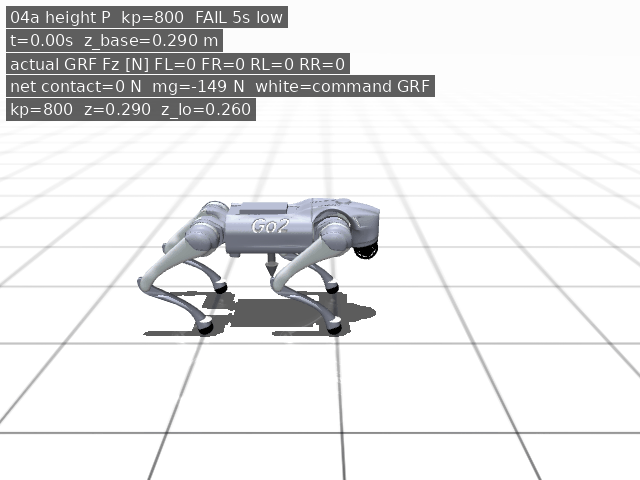

In [3]:
r2 = rollout(800.0, 80.0, n_hi, n_lo)
print("trial2 kp=800  hold_hi", r2["hold_hi"], "hold_lo", r2["hold_lo"], "zT", r2["zT"])
print("trial2 FAIL expected:", r2["hold_lo"] < HOLD_S)

# 失敗 GIF（消さない）
step_k = {"i": 0}
p_gif = MujocoGo2(scene="flat", seed=0)
geoms = p_gif.foot_geom_ids()
z0_g = float(p_gif.base_pos()[2])
z_lo_g = z0_g - DZ_CMD

def tau_fail(plant):
    zref = z0_g if step_k["i"] < n_hi else z_lo_g
    u, cmd = tau_s2b(plant, geoms, zref, 800.0, 80.0)
    step_k["i"] += 1
    tau_fail.last_cmd = cmd
    return u

path_fail = render_rollout_gif(
    p_gif,
    Path("assets/04a_height_p_weak.gif"),
    n_steps=n_hi + n_lo,
    capture_every=80,
    tau_fn=tau_fail,
    command_grf=lambda pl: tau_fail.last_cmd if hasattr(tau_fail, "last_cmd") else None,
    extra_lines=lambda pl: [f"kp=800  z={pl.base_pos()[2]:.3f}  z_lo={z_lo_g:.3f}"],
    title="04a height P  kp=800  FAIL 5s low",
)
print(path_fail.resolve(), path_fail.stat().st_size, "bytes")
display(Image(filename=str(path_fail)))


## 試行 3 — $k_p=8000$、$k_d=400$（仮説 3）

関節 PD は足さない。背景の 2 高さ × 5 秒をログで判定する。


trial3 kp=8000  hold_hi 5.5 hold_lo 6.0680000000000005 z0 0.29017051033281377 zT 0.2600966918661912 z_lo 0.2601705103328138
04 PASS: two z_ref held 5.5 s and 6.0680000000000005 s


/home/takuya/work/mpc_dog/notebook/assets/04b_height_p.gif 3692659 bytes t 13.502000000001178


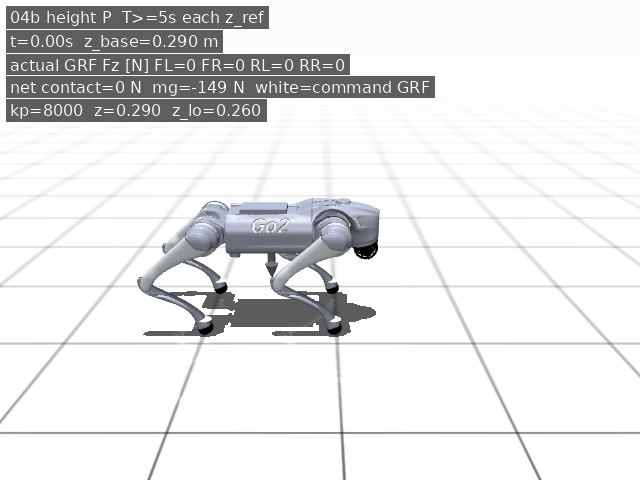

In [4]:
r3 = rollout(KP_OK, KD_OK, n_hi, n_lo)
print("trial3 kp=8000  hold_hi", r3["hold_hi"], "hold_lo", r3["hold_lo"], "z0", r3["z0"], "zT", r3["zT"], "z_lo", r3["z_lo"])
assert r3["hold_hi"] >= HOLD_S, f"nominal held {r3['hold_hi']:.3f}s < {HOLD_S}"
assert r3["hold_lo"] >= HOLD_S, f"low held {r3['hold_lo']:.3f}s < {HOLD_S}"
print("04 PASS: two z_ref held", r3["hold_hi"], "s and", r3["hold_lo"], "s")

step_k = {"i": 0}
plant = MujocoGo2(scene="flat", seed=0)
geoms = plant.foot_geom_ids()
z0 = float(plant.base_pos()[2])
z_lo = z0 - DZ_CMD

def tau_ok(pl):
    zref = z0 if step_k["i"] < n_hi else z_lo
    u, cmd = tau_s2b(pl, geoms, zref, KP_OK, KD_OK)
    step_k["i"] += 1
    tau_ok.last_cmd = cmd
    return u

path = render_rollout_gif(
    plant,
    Path("assets/04b_height_p.gif"),
    n_steps=n_hi + n_lo,
    capture_every=80,
    tau_fn=tau_ok,
    command_grf=lambda pl: tau_ok.last_cmd if hasattr(tau_ok, "last_cmd") else None,
    extra_lines=lambda pl: [f"kp=8000  z={pl.base_pos()[2]:.3f}  z_lo={z_lo:.3f}"],
    title="04b height P  T>=5s each z_ref",
)
print(path.resolve(), path.stat().st_size, "bytes", "t", float(plant.data.time))
display(Image(filename=str(path)))


## 分析

- 試行 1: $k_p=0$ では低い $z^{ref}$ を 5 秒満たさない。力の和が $mg$ だけでは高さを指定できない
- 試行 2: $k_p=800$ は失敗。GIF `04a` を残す
- 試行 3: 同じ MapJT で $F_z$ だけ変えて、背景の 5 秒を両方満たした。関節補間は使っていない

## 次の仮説

足を上げる。立脚だけで体重を持ち、遊脚は軌道追従。それが S3 である。
